In [75]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import find_peaks
from sklearn.metrics import accuracy_score

### Import Data

In [6]:
tackles = pd.read_csv("../data/tackles.csv")
features_data = pd.concat([pd.read_csv(f"../data/features_week_{i}.csv") for i in range(1,10)]).reset_index(drop=True)
visualization_tracking_data = pd.read_csv("../data/visualization_tracking_data.csv")
tackling_probability = pd.read_csv("../data/tackling_probability.csv")
modeling_data = visualization_tracking_data.merge(
    features_data[["gameId", "playId", "nflId", "frameId", "distance_to_ball_carrier", "ball_carrier_distance_to_endzone"]], 
    on=["gameId", "playId", "nflId", "frameId"]
)
modeling_data = modeling_data.merge(tackling_probability, on=["gameId", "playId", "nflId", "frameId"])
defense = modeling_data[(modeling_data["is_defense"]) & (~modeling_data["ball_carrier_id"].isna())].copy()
defense['ott'] = defense["tackling_probability"] / defense["distance_to_ball_carrier"]

In [5]:
defense.columns

Index(['gameId', 'playId', 'nflId', 'frameId', 'club', 'x', 'y',
       'playDirection', 'event', 'ball_carrier', 'ballCarrierId',
       'defensiveTeam', 'absoluteYardlineNumber', 'yardsToGo', 'qbId',
       'ball_carrier_id', 'is_defense', 'is_ball_carrying', 'position',
       'displayName', 'distance_to_ball_carrier',
       'ball_carrier_distance_to_endzone', 'tackling_probability'],
      dtype='object')

## Peak Detection

### Groud Truth Creation

In [43]:
df_multi_peaks = tackles[((tackles["tackle"]==1)|(tackles["assist"]==1))&(tackles["pff_missedTackle"]==1)]
df_multi_peaks = df_multi_peaks.merge(defense[['gameId', 'playId', 'nflId']].drop_duplicates(), on=["gameId", "playId", "nflId"], how='inner')
df_defense_indexed = defense.set_index(["gameId", "playId","nflId"]).sort_index()

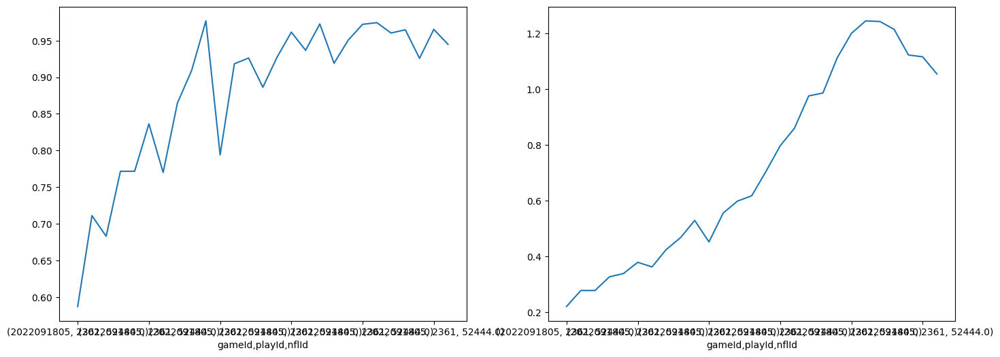

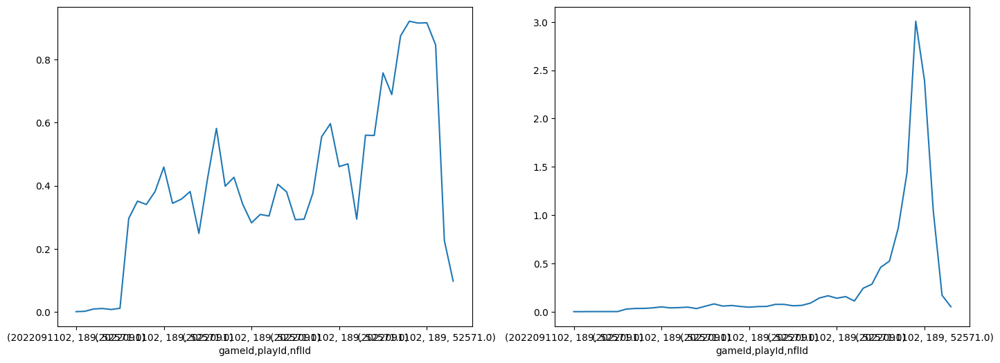

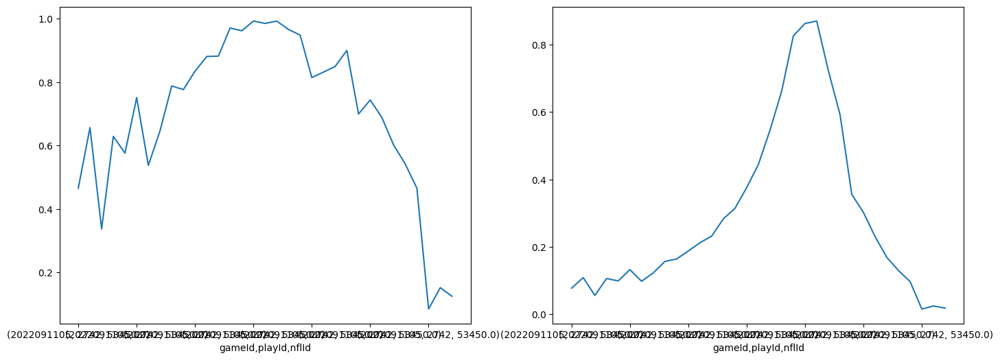

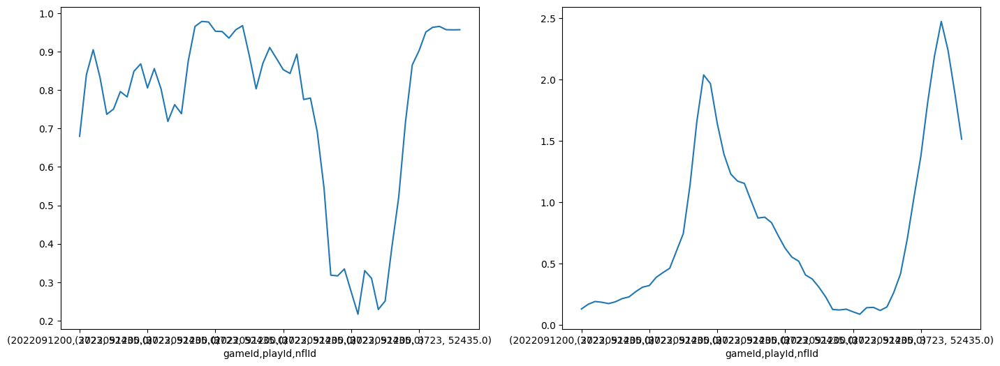

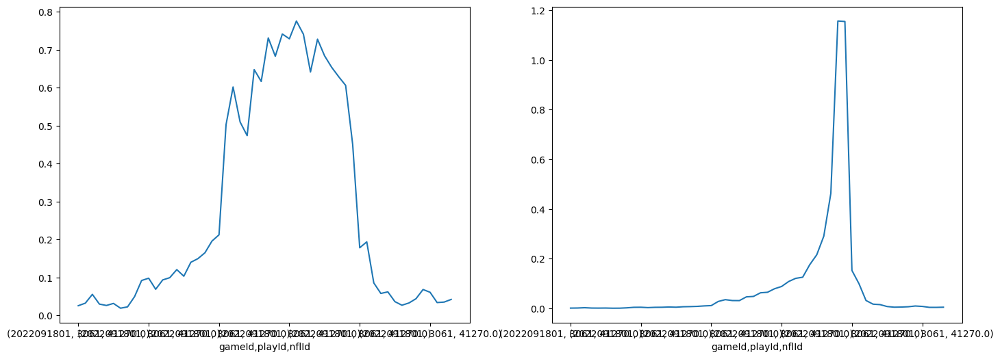

...

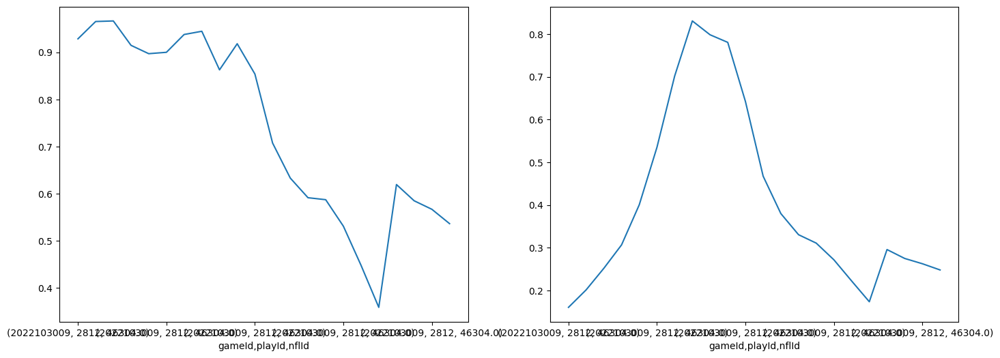

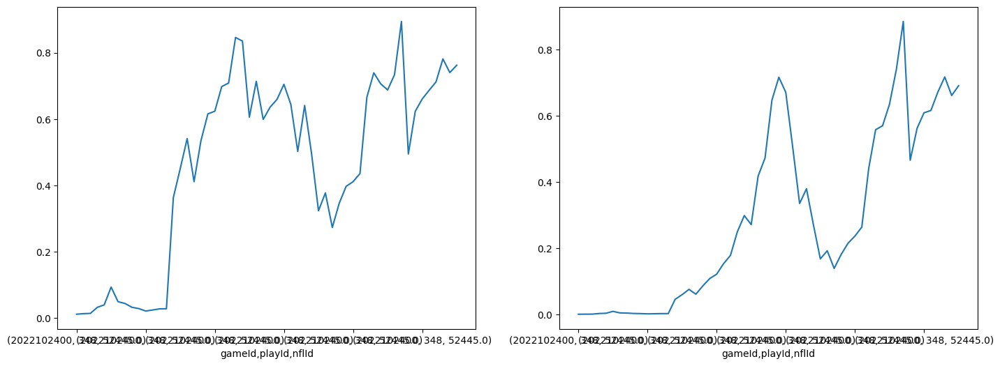

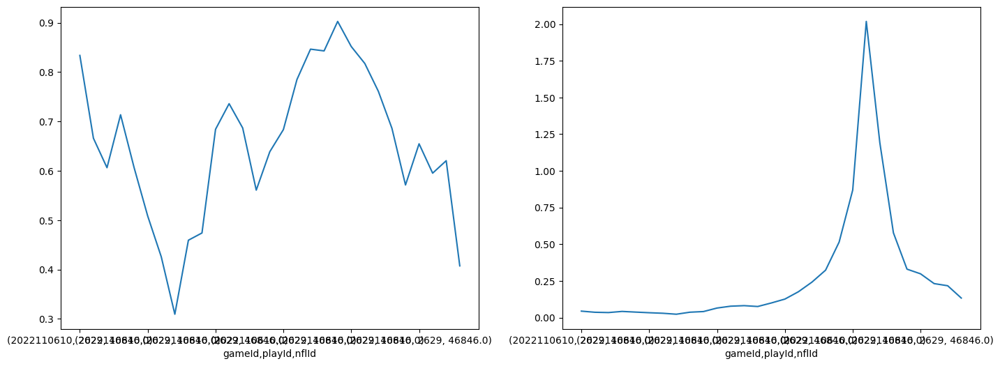

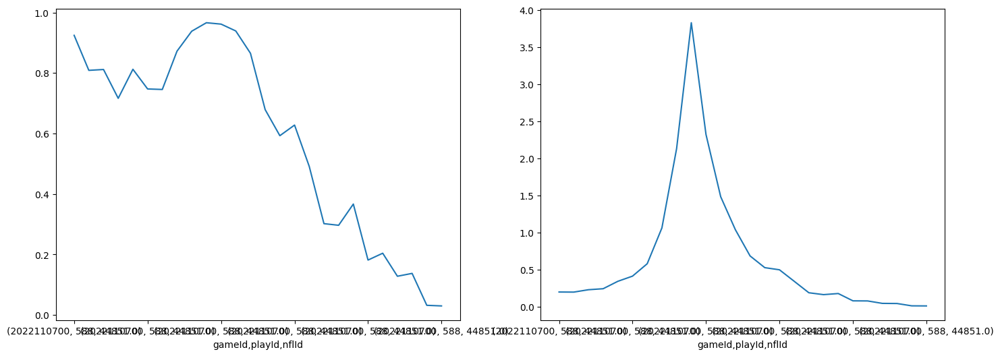

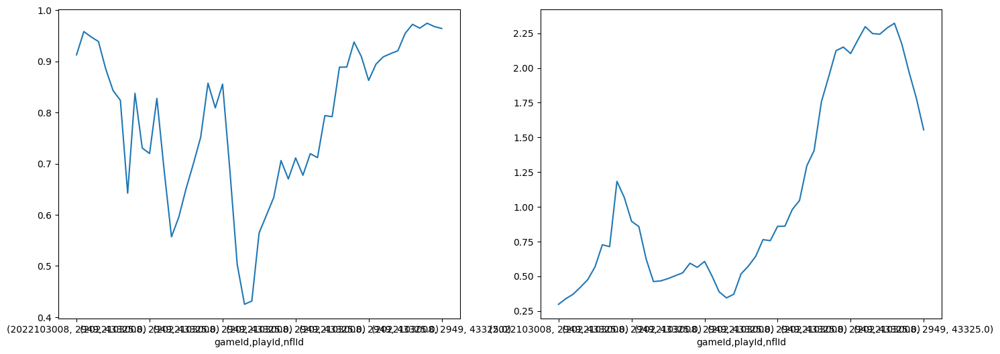

In [45]:
for row in df_multi_peaks.iterrows():
    fig, axes = plt.subplots(1, 2, figsize=(17, 6))
    df_defense_indexed.loc[(row[1]['gameId'], row[1]['playId'], row[1]['nflId'])]["tackling_probability"].plot(ax=axes[0])
    df_defense_indexed.loc[(row[1]['gameId'], row[1]['playId'], row[1]['nflId'])]["ott"].plot(ax=axes[1])
    plt.show()

In [ ]:
nb_peaks = [1,1,1,2,1,2,2,2,1,1,1,2,1,1,2,2,1,2,1,2,2,1,1,1,1,1,1,2,2,2,1,1,1,1,2,1,1,2,2,2,1,1,2,2,1,1,2,2,3,1,2,2,1,2,1,1,2,2,1,2,1,1,2,1,2,2,1,2,1,1,2]
df_multi_peaks['nb_peaks'] = nb_peaks

### Hyperparameters Optimization

tackling_probability

In [116]:
results = []
for height in tqdm(np.linspace(0.1,1,19)):
    for distance in range(1, 70):
        result = {}
        result['height'] = height
        result['distance'] = distance
        peaks_pred = df_multi_peaks.apply(lambda x: find_peaks(df_defense_indexed.loc[(x["gameId"], x["playId"],x["nflId"])]["tackling_probability"].tolist() + [0], height=height, distance=distance)[0], axis=1)
        nb_peaks_pred = [len(peaks) for peaks in peaks_pred]
        result['accuracy'] = accuracy_score(df_multi_peaks['nb_peaks'], nb_peaks_pred)
        results.append(result)
df_results = pd.DataFrame(results)

100%|██████████| 19/19 [00:39<00:00,  2.08s/it]


In [117]:
df_results.sort_values(by='accuracy', ascending=False).head(10)

,height,distance,accuracy
781,0.65,23,0.859155
578,0.50,27,0.859155
712,0.60,23,0.859155
509,0.45,27,0.845070
440,0.40,27,0.845070
715,0.60,26,0.845070
716,0.60,27,0.845070
646,0.55,26,0.845070
782,0.65,24,0.845070
647,0.55,27,0.845070


<Axes: xlabel='distance', ylabel='height'>

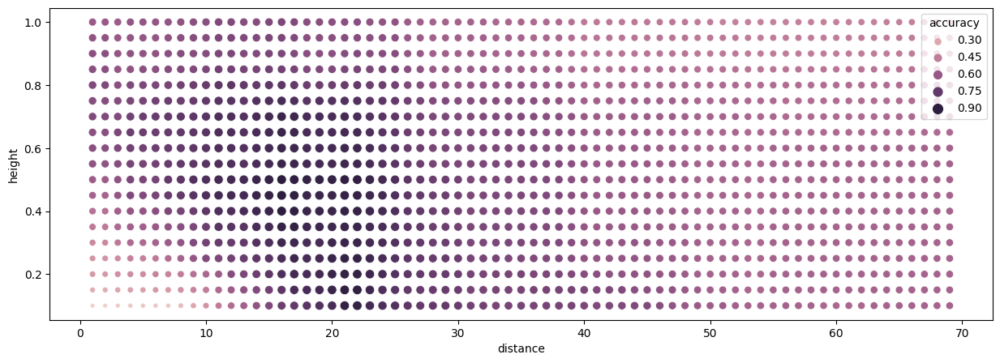

In [123]:
plt.figure(figsize=(15,5))
sns.scatterplot(df_results, x='distance', y='height', size='accuracy', hue='accuracy')

OTT

In [118]:
results = []
for height in tqdm(np.linspace(0.1,1,19)):
    for distance in range(1, 70):
        result = {}
        result['height'] = height
        result['distance'] = distance
        peaks_pred = df_multi_peaks.apply(lambda x: find_peaks(df_defense_indexed.loc[(x["gameId"], x["playId"],x["nflId"])]["ott"].tolist() + [0],  height=height, distance=distance)[0], axis=1)
        nb_peaks_pred = [len(peaks) for peaks in peaks_pred]
        result['accuracy'] = accuracy_score(df_multi_peaks['nb_peaks'], nb_peaks_pred)
        results.append(result)
df_results = pd.DataFrame(results)

100%|██████████| 19/19 [00:38<00:00,  2.02s/it]


In [119]:
df_results.sort_values(by='accuracy', ascending=False).head(10)

,height,distance,accuracy
567,0.50,16,0.901408
498,0.45,16,0.901408
429,0.40,16,0.901408
89,0.15,21,0.887324
90,0.15,22,0.887324
499,0.45,17,0.887324
430,0.40,17,0.887324
572,0.50,21,0.887324
573,0.50,22,0.887324
568,0.50,17,0.887324


<Axes: xlabel='distance', ylabel='height'>

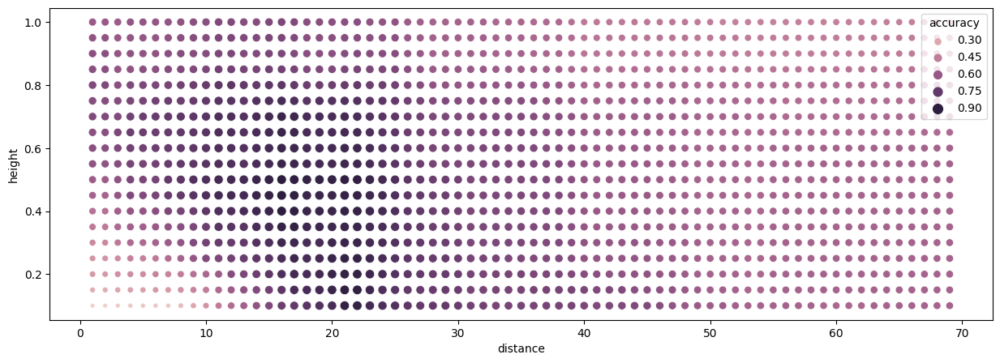

In [120]:
plt.figure(figsize=(15,5))
sns.scatterplot(df_results, x='distance', y='height', size='accuracy', hue='accuracy')

### Results

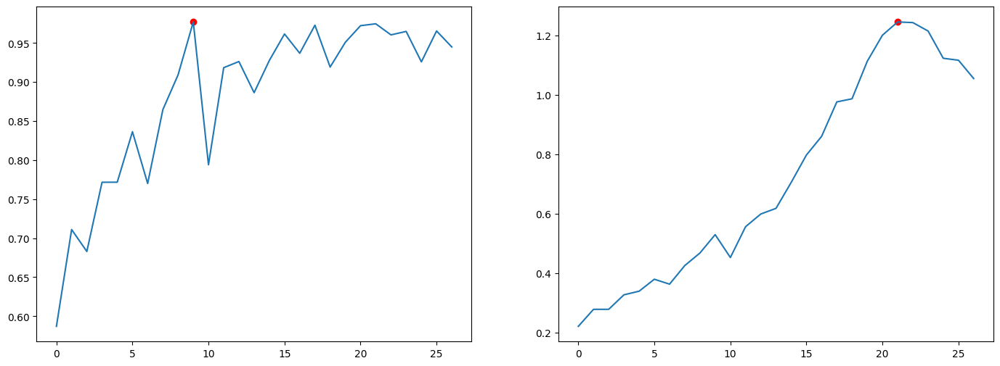

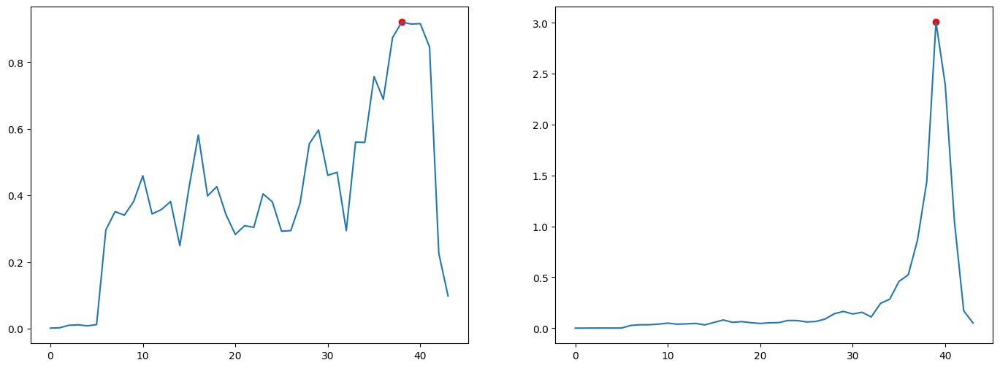

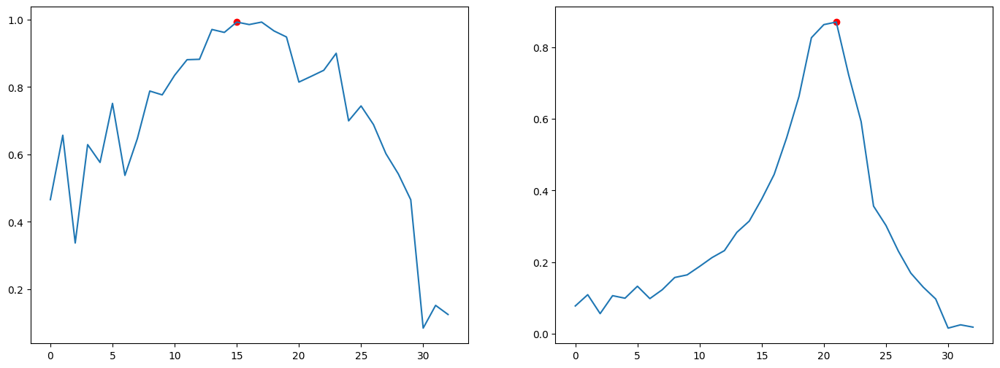

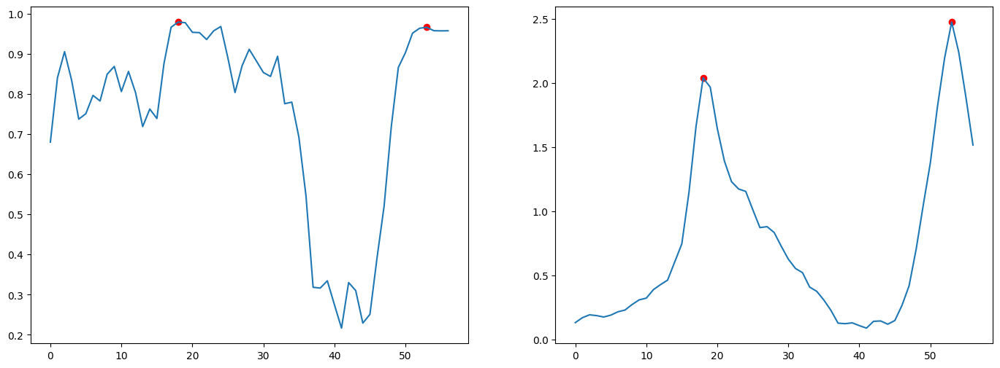

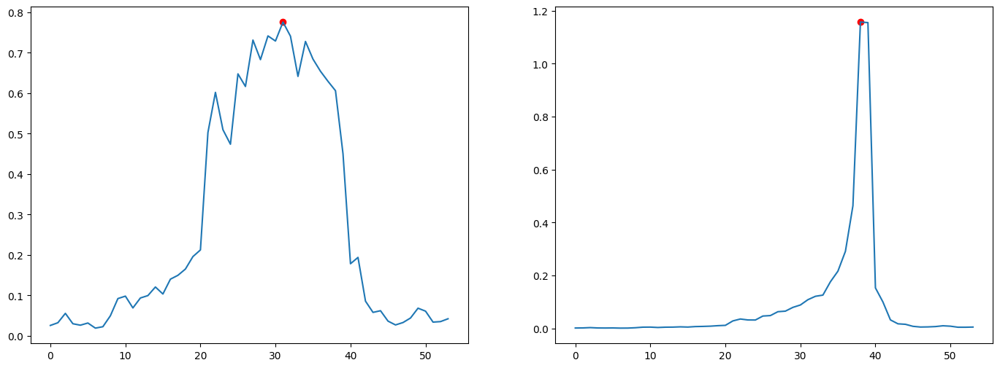

...

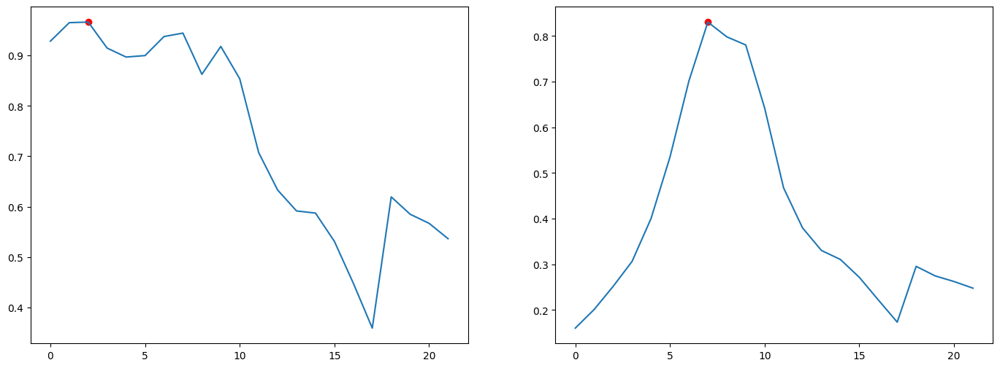

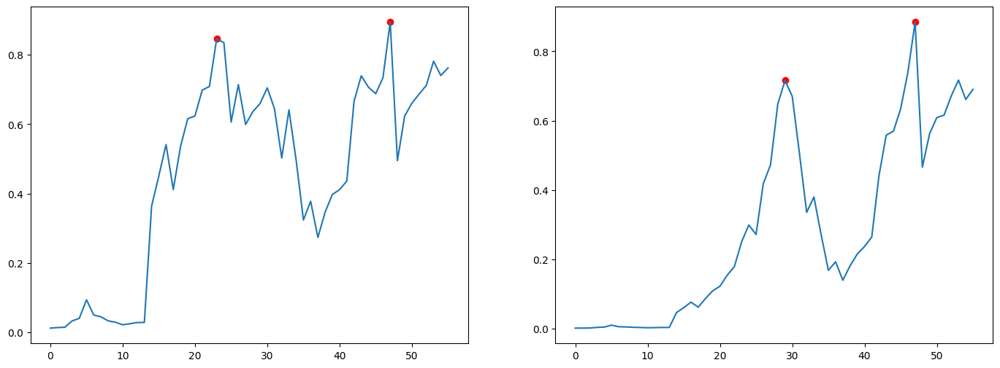

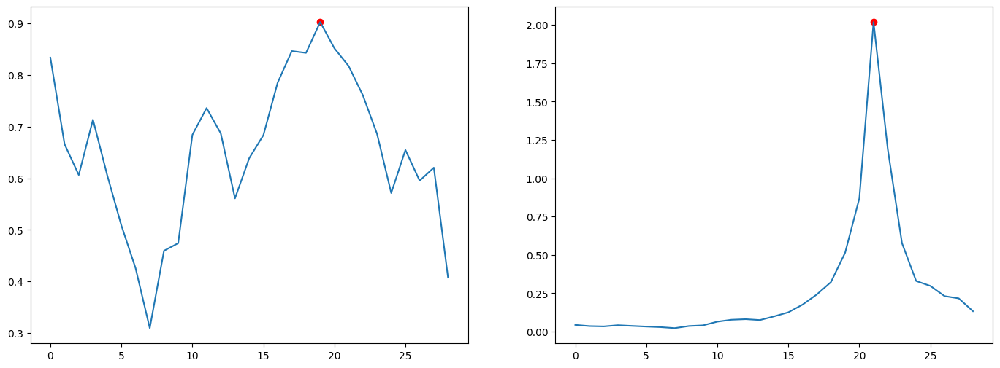

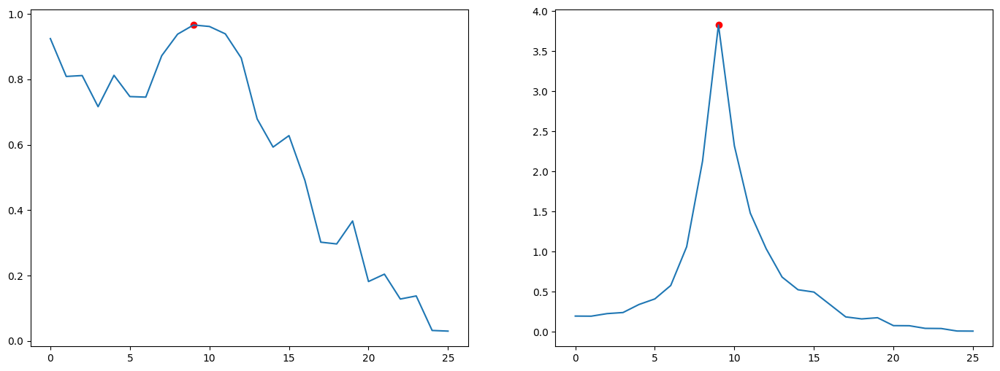

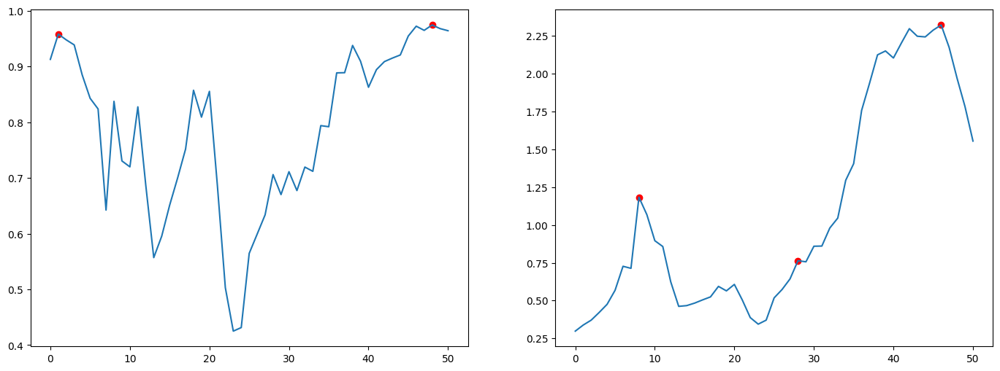

In [122]:
for row in df_multi_peaks.iterrows():
    fig, axes = plt.subplots(1, 2, figsize=(17, 6))
    peaks_pred = find_peaks(df_defense_indexed.loc[(row[1]['gameId'], row[1]['playId'], row[1]['nflId'])]["tackling_probability"].tolist() + [0],  height=.65, distance=23)[0]
    df_defense_indexed.loc[(row[1]['gameId'], row[1]['playId'], row[1]['nflId'])]["tackling_probability"].reset_index(drop=True).plot(ax=axes[0])
    for peak in peaks_pred:
        axes[0].scatter(peak, df_defense_indexed.loc[(row[1]['gameId'], row[1]['playId'], row[1]['nflId'])]["tackling_probability"].iloc[peak], color='red')
    peaks_pred = find_peaks(df_defense_indexed.loc[(row[1]['gameId'], row[1]['playId'], row[1]['nflId'])]["ott"].tolist() + [0],  height=.5, distance=16)[0]
    df_defense_indexed.loc[(row[1]['gameId'], row[1]['playId'], row[1]['nflId'])]["ott"].reset_index(drop=True).plot(ax=axes[1])
    for peak in peaks_pred:
        axes[1].scatter(peak, df_defense_indexed.loc[(row[1]['gameId'], row[1]['playId'], row[1]['nflId'])]["ott"].iloc[peak], color='red')
    plt.show()